Random adjacency matrix:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


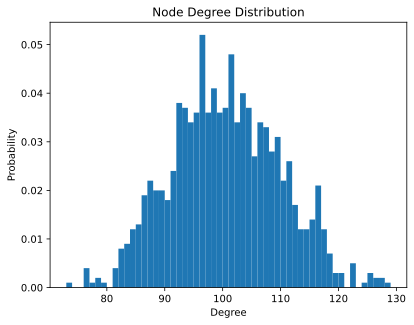

In [20]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg' # figuras alta calidad jupyter


def generate_erdos_renyi(n:int, p:int):
    """
    Creamos un grafo aleatorio tipo Erdős-Rényi.

    Parámetros:
    - n (int): Número de nodos.
    - p (float): Probabilidad de que exista una arista entre pares de nodos
    
    Return:
    - numpy.ndarray: Matriz de adyacencia que representa al grafo aleatorio.
    """
    adjacency_matrix = np.random.rand(n, n)
    #adjacency_matrix = (adjacency_matrix+adjacency_matrix.transpose())/2
    adjacency_matrix = adjacency_matrix < p
    np.fill_diagonal(adjacency_matrix, 0)  # Ensure no self-loops
    adjacency_matrix = adjacency_matrix.astype(int)
    return adjacency_matrix

def degree_distribution(adjacency_matrix):
    degree_distribution = np.sum(adjacency_matrix, axis=0)
    return degree_distribution

def plot_degree_distribution(degree_distribution):

    plt.hist(degree_distribution, bins=np.arange(degree_distribution.min(), degree_distribution.max() + 1), density=True)
    plt.title('Node Degree Distribution')
    plt.xlabel('Degree')
    plt.ylabel('Probability')
    plt.show()
    
def plot_Network(G):
    fig = plt.figure("Degree of a random graph", figsize=(6, 6))
    # Create a gridspec for adding subplots of different sizes
    axgrid = fig.add_gridspec(5, 4)

    ax0 = fig.add_subplot(axgrid[0:3, :])
    Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])
    pos = nx.spring_layout(Gcc, seed=10396953)
    nx.draw_networkx_nodes(Gcc, pos, ax=ax0, node_size=20)
    nx.draw_networkx_edges(Gcc, pos, ax=ax0, alpha=0.4)
    ax0.set_title("Random Network")
    ax0.set_axis_off()

    # Parámetros de la simulación
n = 1000   # Número de nodos
p = 0.1  # Probabilidad de existencia de cada vértice

# Creamos la matriz de adyacencia y la imprimimos
adjacency_matrix = generate_erdos_renyi(n, p)
print("Random adjacency matrix:")
print(adjacency_matrix)

# Calculamos la distribución de la red
degree_distribution = degree_distribution(adjacency_matrix)

# Graficamos la distribución de nodos
plot_degree_distribution(degree_distribution)

# Creamos la red compleja usando NetworkX
G = nx.from_numpy_matrix(adjacency_matrix)
plot_Network(G)

In [10]:
import numpy as np
n = 5
X = np.random.rand(n,n) # no es simetrico
X = (X + X.transpose())/2
print(X-X.transpose())
print(X)
P = 0.5
Y = X<P
print(Y)
print(Y.astype(int))

[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
[[0.28527763 0.80220548 0.46575773 0.45310953 0.58450939]
 [0.80220548 0.22945705 0.35283474 0.22997415 0.39511863]
 [0.46575773 0.35283474 0.06033256 0.38641352 0.07844675]
 [0.45310953 0.22997415 0.38641352 0.93308934 0.62234247]
 [0.58450939 0.39511863 0.07844675 0.62234247 0.19819955]]
[[ True False  True  True False]
 [False  True  True  True  True]
 [ True  True  True  True  True]
 [ True  True  True False False]
 [False  True  True False  True]]
[[1 0 1 1 0]
 [0 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 0 0]
 [0 1 1 0 1]]
